___

# Quail segmentation and feature extraction exploration #

<!-- *12 January 2023* -->
*18 January 2023*

Based on `Segmentation_01.ipyb` from co-coding with Robert Haase ~~last week~~ 3 *January 2023*.

I'd like the full workflow in Jupyter; then add exploration with other background de-noising or sklearn Random Forest Segmentation.

## Previous analysis ##

Cropped node and non-node regions from 

`Quail_01_Region_Crop.ipynb`

## Import tools ##

In [48]:
import napari
import napari_segment_blobs_and_things_with_membranes as nsbatwm  # version 0.3.3
import napari_crop
import pyclesperanto_prototype as cle  # version 0.21.2
import pandas as pd

from napari_simpleitk_image_processing import label_statistics
from skimage.io import imread, imsave
from napari.utils import nbscreenshot

import napari_skimage_regionprops as nsr

from sklearn.preprocessing import StandardScaler
import seaborn
import stackview
import time

In [2]:
print(cle.get_device())

<AMD Radeon Pro 560X Compute Engine on Platform: Apple (2 refs)>


In [3]:
cle.select_device('CPU')
# cle.select_device('GPU')

<Intel(R) Core(TM) i7-8850H CPU @ 2.60GHz on Platform: Apple (2 refs)>

In [4]:
print(cle.get_device())

<Intel(R) Core(TM) i7-8850H CPU @ 2.60GHz on Platform: Apple (2 refs)>


## Set filenames ##

In [5]:
source_stack          = '/Volumes/Quail/Quail/220214_highresnode/220214_63x_node_scan_121t_11x11y_MERGED_rotated.tif' # not used in this notebook 
datafolder            = 'data/'
cropped_node_file     = f'{datafolder}220214_cropped_node.tif'
cropped_non_node_file = f'{datafolder}220214_cropped_non_node.tif'

## Open viewer ##

In [6]:
viewer = napari.Viewer()

## Load node and non-node regions ##

One in Henson's node, the other in the periphery of the tissue

In [7]:
# viewer.open('/Volumes/Quail/Quail/220214_highresnode/220214_63x_node_scan_121t_11x11y_MERGED_rotated.tif')
cropped_node     = imread(cropped_node_file)
cropped_non_node = imread(cropped_non_node_file)

In [8]:
viewer.add_image(
    cropped_node,
    colormap='gray_r'
)

<Image layer 'cropped_node' at 0x18881dfd0>

In [9]:
viewer.add_image(
    cropped_non_node,
    colormap='gray_r'
)

<Image layer 'cropped_non_node' at 0x1949bfcd0>

## Scale 3D data ##

Allows exploration on local mac (M1 or Intel)

In [10]:
voxel_size_xy = 1
voxel_size_z  = 5     # according to Adrian the pixels in this dataset are isotropic, but watershed works better with "deeper" cells
zoom          = 0.25 

cl.OCLArray([[[ 4.,  0.,  0., ...,  0.,  4., 16.],
        [ 0., 36., 26., ...,  0.,  0.,  5.],
        [29.,  0., 15., ...,  4., 14.,  0.],
        ...,
        [11.,  0., 11., ...,  6.,  6.,  0.],
        [ 6.,  1.,  0., ..., 23.,  0.,  4.],
        [19., 12., 18., ...,  0.,  8.,  0.]],

       [[11.,  6., 12., ...,  3.,  0., 10.],
        [ 3.,  0.,  0., ..., 13., 24., 10.],
        [ 0., 36.,  3., ...,  0.,  6., 12.],
        ...,
        [ 0.,  0., 13., ...,  7.,  2.,  0.],
        [ 0.,  7., 10., ...,  0., 10.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[ 0., 14., 17., ..., 15.,  0.,  4.],
        [ 8.,  0., 25., ...,  1.,  0.,  0.],
        [ 0.,  0.,  1., ..., 53.,  1.,  0.],
        ...,
        [ 2., 21.,  0., ...,  0.,  0.,  5.],
        [ 0.,  0.,  8., ...,  0.,  0.,  0.],
        [ 7.,  0.,  0., ...,  0.,  5.,  5.]],

       ...,

       [[ 0.,  0.,  3., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  2., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  3.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  5.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0., 12.,  0., ...,  0.,  0.,  0.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [10.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
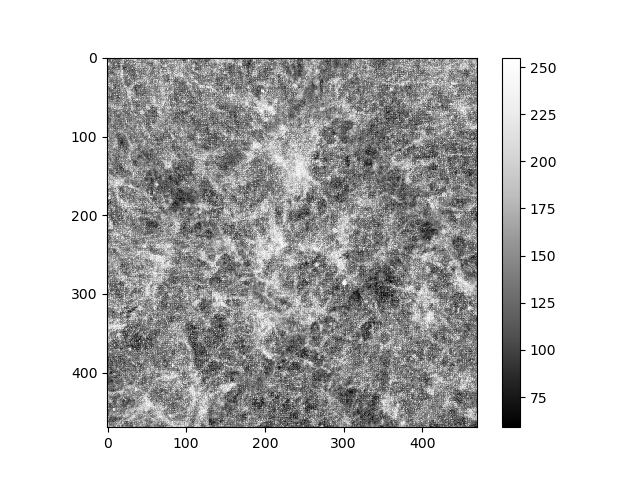
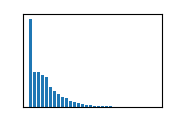

In [11]:
cropped_node_scaled = (
    cle.scale(
        cropped_node, 
        factor_x=voxel_size_xy*zoom, 
        factor_y=voxel_size_xy*zoom, 
        factor_z=voxel_size_z*zoom, 
        auto_size=True,
        # linear_interpolation=True # linear interpolation not supported on intel cpu
    ) 
)
cropped_node_scaled

cl.OCLArray([[[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 3.,  0.,  0., ...,  0.,  0.,  5.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  1.,  0., ...,  0.,  0.,  0.],
        [ 1.,  0.,  0., ...,  3.,  0.,  0.]],

       [[ 5.,  0.,  5., ...,  0.,  0.,  5.],
        [ 0.,  0.,  0., ...,  0.,  0.,  7.],
        [ 0.,  0.,  8., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  1.,  0.,  7.],
        [ 1.,  0.,  7., ...,  2.,  0.,  2.],
        [ 3.,  0.,  0., ...,  5., 15.,  0.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0., 12., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  5.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0., 15., ...,  0.,  0.,  0.],
        [ 0.,  1.,  0., ...,  0.,  0.,  0.]],

       ...,

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  3.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]],

       [[ 5.,  0.,  0., ..., 10.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  1.],
        [ 0.,  0.,  0., ...,  0., 15.,  0.]],

       [[ 0.,  7.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0., 12., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  5.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]], dtype=float32)
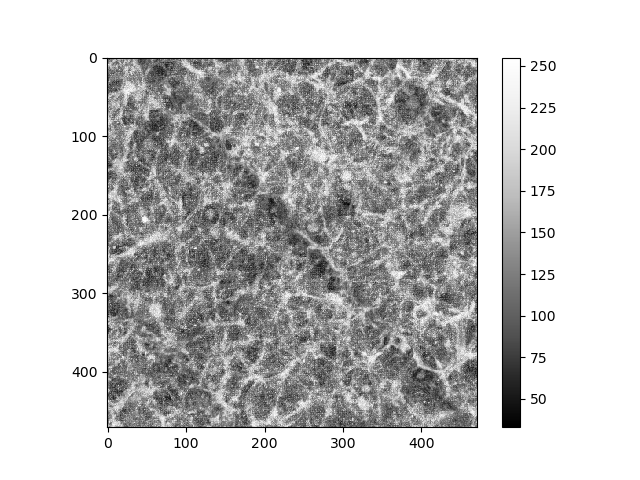
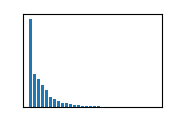

In [12]:
cropped_non_node_scaled = (
    cle.scale(
        cropped_non_node, 
        factor_x=voxel_size_xy*zoom, 
        factor_y=voxel_size_xy*zoom, 
        factor_z=voxel_size_z*zoom, 
        auto_size=True,
        # linear_interpolation=True # linear interpolation not supported on intel cpu
    ) 
)
cropped_non_node_scaled

In [13]:
cropped_node_scaled_layer = (
    viewer.add_image(
        cropped_node_scaled, 
        colormap='gray_r',
        interpolation3d='bicubic',
        contrast_limits=[0,255],
    )
)

In [14]:
cropped_non_node_scaled_layer = (
    viewer.add_image(
        cropped_non_node_scaled, 
        colormap='gray_r',
        interpolation3d='bicubic',
        contrast_limits=[0,255],
    )
)

## Close unneeded layers ##

Free up memory.

In [15]:
viewer.layers.remove('cropped_node')

In [16]:
viewer.layers.remove('cropped_non_node')

In [17]:
viewer.reset_view()

## Local minima seeded watershed in 3D ##

Uses 3D data.  Local minima are regions between membranes as seed.

```
Segment cells in images with fluorescently marked membranes.
    The two sigma parameters allow tuning the segmentation result. The first sigma controls how close detected cells
    can be (spot_sigma) and the second controls how precise segmented objects are outlined (outline_sigma). Under the
    hood, this filter applies two Gaussian blurs, local minima detection and a seeded watershed.
    See also
    --------
    .. [1] https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_watershed.html
```

In [18]:
# Robert suggested 25 and 5 for the spot sigma and outline sigmas
# By my eye, 30 and 10 are a bit better
lmsw_3d = nsbatwm.local_minima_seeded_watershed(cropped_node_scaled, 30*zoom, 10.0*zoom)

In [19]:
lmsw_labels = viewer.add_labels(lmsw_3d)

In [20]:
# exclude labels on the edge of the stack
exclude_labels_on_edges = cle.exclude_labels_on_edges(lmsw_3d)
# viewer.add_labels(
#     exclude_labels_on_edges, name='Result of exclude_labels_on_edges (clesperanto)')

In [21]:
# exclude small labels
exclude_small_labels = cle.exclude_small_labels(exclude_labels_on_edges, None, 400*zoom)  # done ~~base small on zoom in future~~ was 100 for zoom of 0.25 => 400*0.25 = 100
# viewer.add_labels(
#     exclude_small_labels, name='Result of exclude_small_labels (clesperanto)')

In [22]:
labels_3d_layer = (
    viewer.add_labels(
        exclude_small_labels,
        opacity=0.5,
    )
)

## Vary voxel_size_z ## 

To examine the effect of scaling on watershed

In [ ]:
voxel_size_xy = 1
voxel_size_z  = 5     # according to Adrian the pixels in this dataset are isotropic
zoom          = 0.25 

In [ ]:
voxel_size_z  = [1,2,3,4,5,6] 

for z in voxel_size_z:
    cropped_node_scaled = cle.scale(
        cropped_node, 
        factor_x=voxel_size_xy*zoom, 
        factor_y=voxel_size_xy*zoom,  
        factor_z=z*zoom,  
        auto_size=True,
        # linear_interpolation=True # linear interpolation not supported on intel cpu
    ) 
    
    lmsw_3d = nsbatwm.local_minima_seeded_watershed(cropped_node_scaled, 30*zoom, 10.0*zoom)
    
    exclude_labels_on_edges = cle.exclude_labels_on_edges(lmsw_3d)
    exclude_small_labels    = cle.exclude_small_labels(exclude_labels_on_edges, None,  400*zoom)  # done ~~base small on zoom in future~~ was 100 for zoom of 0.25 => 400*0.25 = 100
    
    viewer.add_labels(exclude_small_labels, name=f'watershed_z_scale{z}', opacity=0.5)
    
    data                   = viewer.layers[-1].data
    filename               = f'{datafolder}{viewer.layers[-1].name}.tif'
    
    print(f'Saving... {filename}')
    imsave(filename, data, plugin='tifffile')

### XYZ scale of (1,1,5) gives the best segmentation ###

In [ ]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['watershed_z_scale5' ].visible = True

In [ ]:
nbscreenshot(viewer)

### Vary Z around 5 ###

In [ ]:
voxel_size_z  = [4.5, 4.6, 4.7, 4.8, 4.9, 5.1, 5.2, 5.3, 5.4, 5.5] 

for z in voxel_size_z:
    cropped_node_scaled = cle.scale(
        cropped_node, 
        factor_x=voxel_size_xy*zoom, 
        factor_y=voxel_size_xy*zoom,  
        factor_z=z*zoom,  
        auto_size=True,
        # linear_interpolation=True # linear interpolation not supported on intel cpu
    ) # linear_interpolation=True # linear interpolation not supported on intel cpu
    
    lmsw_3d = nsbatwm.local_minima_seeded_watershed(cropped_node_scaled, 30*zoom, 10.0*zoom)
    
    exclude_labels_on_edges = cle.exclude_labels_on_edges(lmsw_3d)
    exclude_small_labels    = cle.exclude_small_labels(exclude_labels_on_edges, None, 400*zoom)  # done ~~base small on zoom in future~~
    
    viewer.add_labels(exclude_small_labels, name=f'watershed_z_scale{z}', opacity=0.5)
    
    data                   = viewer.layers[-1].data
    filename               = f'{datafolder}{viewer.layers[-1].name}.tif'
    
    print(f'Saving... {filename}')
    imsave(filename, data, plugin='tifffile')

### XYZ scale of (1,1,5) still gives the best segmentation ###

By visual inspection

#### XYZ (1,1,4.5) ###

In [ ]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['watershed_z_scale4.5' ].visible = True

In [ ]:
nbscreenshot(viewer)

#### XYZ (1,1,5) ###

In [ ]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['watershed_z_scale5' ].visible = True

In [ ]:
nbscreenshot(viewer)

## Empirically vary watershed sigmas ##

Generate and save as we go.

In [27]:
voxel_size_xy = 1
voxel_size_z  = 5     # according to Adrian the pixels in this dataset are isotropic
zoom          = 0.25 

spot_sigmas = [10, 20, 30, 40, 50]
outline_sigmas = [5, 7, 10, 12]
# spot_sigmas = [30]
# outline_sigmas = [10]

In [28]:
for ss in spot_sigmas:
    for os in outline_sigmas:
        
        lmsw_3d = nsbatwm.local_minima_seeded_watershed(cropped_node_scaled, ss*zoom, os*zoom)
        # lmsw_3d = nsbatwm.local_minima_seeded_watershed(cropped_node_scaled, 30*zoom, 10.0*zoom)
        exclude_labels_on_edges = cle.exclude_labels_on_edges(lmsw_3d)
        exclude_small_labels = cle.exclude_small_labels(exclude_labels_on_edges, None, 400*zoom) # done ~~base small on zoom in future~~
        viewer.add_labels(exclude_small_labels, name=f'spot{ss:02}_outline{os:02}', opacity=0.5)
        data                   = viewer.layers[-1].data
        filename               = f'{datafolder}{viewer.layers[-1].name}.tif'
    
        print(f'Saving... {filename}')
        imsave(filename, data, plugin='tifffile')

Saving... data/spot10_outline05.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot10_outline05.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot10_outline07.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot10_outline07.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot10_outline10.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot10_outline10.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot10_outline12.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot10_outline12.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot20_outline05.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot20_outline05.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot20_outline07.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot20_outline07.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot20_outline10.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot20_outline10.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot20_outline12.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot20_outline12.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot30_outline05.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot30_outline05.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot30_outline07.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot30_outline07.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot30_outline10 [2].tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot30_outline10 [2].tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot30_outline12.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot30_outline12.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot40_outline05.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot40_outline05.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot40_outline07.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot40_outline07.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot40_outline10.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot40_outline10.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot40_outline12.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot40_outline12.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot50_outline05.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot50_outline05.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot50_outline07.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot50_outline07.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot50_outline10.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot50_outline10.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


Saving... data/spot50_outline12.tif


/var/folders/2d/hmb85pbd3b934r6fb9dy6l380000gp/T/ipykernel_17391/3373324442.py:13: UserWarning: data/spot50_outline12.tif is a low contrast image
  imsave(filename, data, plugin='tifffile')


### Small spot sigmas result in oversegmentation ###

By visual inspection

In [31]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['spot10_outline10' ].visible = True

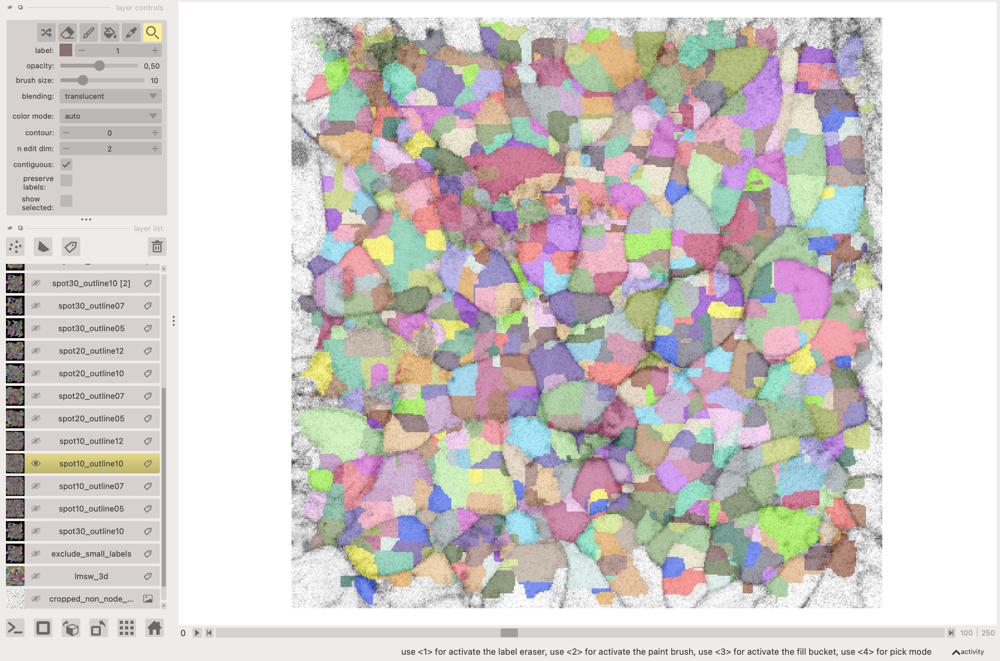

In [32]:
nbscreenshot(viewer)

### High outline sigmas result in flooding ###

By visual inspection, the levees breach and one region leaks into adjacent regions

In [33]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['spot30_outline12' ].visible = True

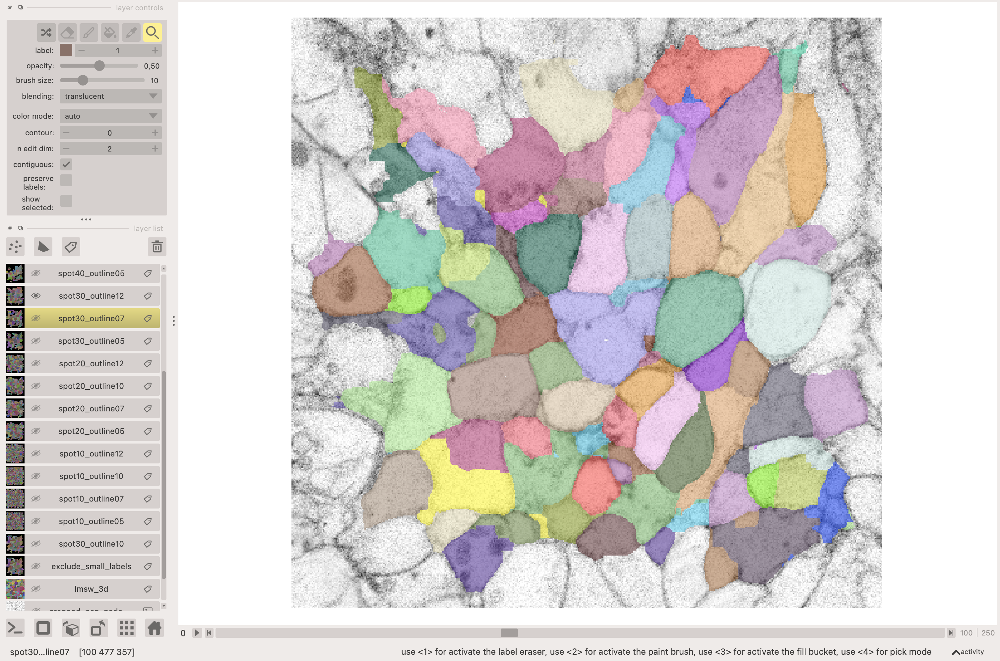

In [34]:
nbscreenshot(viewer)

## Spot $\sigma$ of 30 and outline $\sigma$ of 5 or 7 seem best ##

By visual inspection.

In [35]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['spot30_outline07' ].visible = True

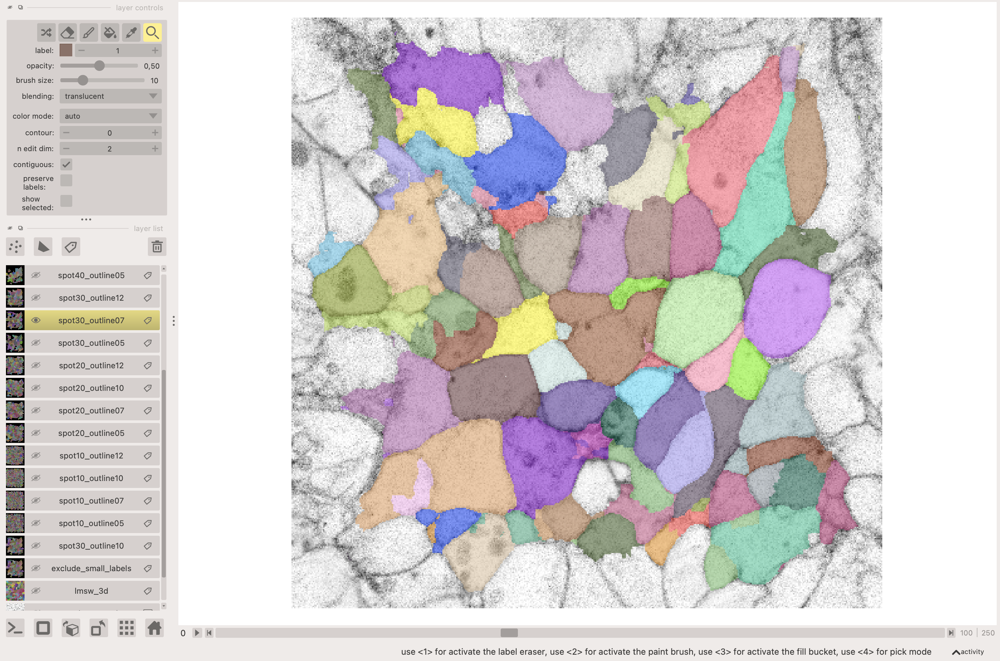

In [36]:
nbscreenshot(viewer)

In [37]:
for layer in viewer.layers:
    layer.visible=False
    
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['spot30_outline05' ].visible = True

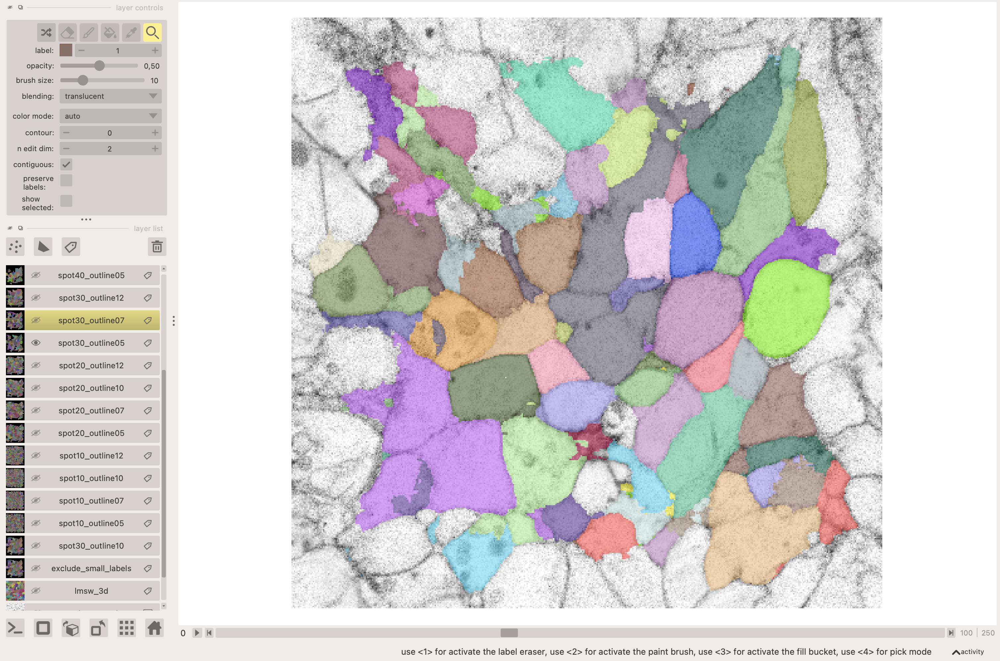

In [38]:
nbscreenshot(viewer)

In [62]:
layers_to_keep = ['cropped_node_scaled', 'exclude_small_labels', 'spot30_outline07']
layers_in_viewer = [layer.name for layer in viewer.layers]

for layer in layers_in_viewer:
    if layer not in layers_to_keep:
        # print(layer)
        viewer.layers.remove(layer)

In [63]:
viewer.layers['cropped_node_scaled'].visible = True
viewer.layers['spot30_outline07'   ].visible = True

## End ##